# STAT306 Final Group 19

# Data Description

In [2]:
# Library Imports
library(tidyverse)
library(corrplot)
library(ggplot2)
library(car)
library(GGally)
library(rsample)
library(caret)
library(patchwork)
library(leaps)

#if needed
#install.packages("corrplot", dependencies=TRUE, repos='http://cran.rstudio.com/')
#install.packages("leaps",  dependencies = TRUE, repos = "https://cloud.r-project.org/")
#install.packages("rsample", dependencies = TRUE, repos = "https://cloud.r-project.org/")
#install.packages("patchwork")

Warning message:
“package ‘lubridate’ was built under R version 4.4.2”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
corrplot 0.95 loaded

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘packa

In [3]:
gym_membership_data <- read_csv("gym_members_exercise_tracking.csv")
head(gym_membership_data)

Rows: 973 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): Gender, Workout_Type
dbl (13): Age, Weight (kg), Height (m), Max_BPM, Avg_BPM, Resting_BPM, Sessi...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
56,Male,88.3,1.71,180,157,60,1.69,1313,Yoga,12.6,3.5,4,3,30.20
46,Female,74.9,1.53,179,151,66,1.30,883,HIIT,33.9,2.1,4,2,32.00
32,Female,68.1,1.66,167,122,54,1.11,677,Cardio,33.4,2.3,4,2,24.71
25,Male,53.2,1.70,190,164,56,0.59,532,Strength,28.8,2.1,3,1,18.41
38,Male,46.1,1.79,188,158,68,0.64,556,Strength,29.2,2.8,3,1,14.39
56,Female,58.0,1.68,168,156,74,1.59,1116,HIIT,15.5,2.7,5,3,20.55


In [3]:
num_cols <- ncol(gym_membership_data)
cat("This dataset has", num_cols ,"variables.")

This dataset has 15 variables.

In [8]:
n <- nrow(gym_membership_data)
cat("This dataset has", n ,"observations.")

This dataset has 973 observations.

| Variable | Description |
|----------|-------------|
| `Age` | Age of the gym member (years) |
| `Gender` | Gender of the gym member (Male or Female) |
| `Weight` | Member’s weight in kilograms (kg) |
| `Height` | Member’s height in meters (m) |
| `Max_BPM` | Maximum heart rate during workout sessions (beats per minute) |
| `Avg_BPM` | Average heart rate during workout sessions (beats per minute) |
| `Resting_BPM` | Heart rate at rest before workout (beats per minute) |
| `Session_Duration` | Duration of each workout session (hours) |
| `Calories_Burned` | Total calories burned during each session |
| `Workout_Type` | Type of workout performed (e.g., Cardio, Strength, Yoga, HIIT) |
| `Fat_Percentage` | Body fat percentage of the member (%) |
| `Water_Intake` | Daily water intake during workouts (liters) |
| `Workout_Frequency` | Number of workout sessions per week (days/week) |
| `Experience_Level` | Level of experience, from beginner (1) to expert (3) |
| `BMI` | Body Mass Index (Weight in kg / (Height in m)^2) |

# Questions for Investigation

## Insert text here


# Exploratory Data Analysis (EDA)

In [9]:
head(gym_membership_data, 10)

Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
56,Male,88.3,1.71,180,157,60,1.69,1313,Yoga,12.6,3.5,4,3,30.20
46,Female,74.9,1.53,179,151,66,1.30,883,HIIT,33.9,2.1,4,2,32.00
32,Female,68.1,1.66,167,122,54,1.11,677,Cardio,33.4,2.3,4,2,24.71
25,Male,53.2,1.70,190,164,56,0.59,532,Strength,28.8,2.1,3,1,18.41
38,Male,46.1,1.79,188,158,68,0.64,556,Strength,29.2,2.8,3,1,14.39
56,Female,58.0,1.68,168,156,74,1.59,1116,HIIT,15.5,2.7,5,3,20.55
36,Male,70.3,1.72,174,169,73,1.49,1385,Cardio,21.3,2.3,3,2,23.76
40,Female,69.7,1.51,189,141,64,1.27,895,Cardio,30.6,1.9,3,2,30.57
28,Male,121.7,1.94,185,127,52,1.03,719,Strength,28.9,2.6,4,2,32.34


In [4]:
gym_membership_data <- gym_membership_data %>%
  mutate(Gender = as.factor(Gender),
         Workout_Type = as.factor(Workout_Type),
         Experience_Level = as.factor(Experience_Level))

In [5]:
# check for NA
colSums(is.na(gym_membership_data))

Age                        Gender 
                            0                             0 
                  Weight (kg)                    Height (m) 
                            0                             0 
                      Max_BPM                       Avg_BPM 
                            0                             0 
                  Resting_BPM      Session_Duration (hours) 
                            0                             0 
              Calories_Burned                  Workout_Type 
                            0                             0 
               Fat_Percentage         Water_Intake (liters) 
                            0                             0 
Workout_Frequency (days/week)              Experience_Level 
                            0                             0 
                          BMI 
                            0

In [6]:
names(gym_membership_data) <- make.names(names(gym_membership_data))
colnames(gym_membership_data)

[1] "Age"                           "Gender"                       
 [3] "Weight..kg."                   "Height..m."                   
 [5] "Max_BPM"                       "Avg_BPM"                      
 [7] "Resting_BPM"                   "Session_Duration..hours."     
 [9] "Calories_Burned"               "Workout_Type"                 
[11] "Fat_Percentage"                "Water_Intake..liters."        
[13] "Workout_Frequency..days.week." "Experience_Level"             
[15] "BMI"

## Data Visualization

In [13]:
# gym_membership_pair_plots <- 
#     gym_membership_data %>%
#     ggpairs(progress = FALSE) +
#     ggtitle("Pairwise Plots of All Variables") +
#     theme(
#         plot.title = element_text(face = "bold", hjust = 0.5, size = 18),
#         text = element_text(size = 10),
#         axis.title = element_text(face = "bold")
#     ) 

# gym_membership_pair_plots

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


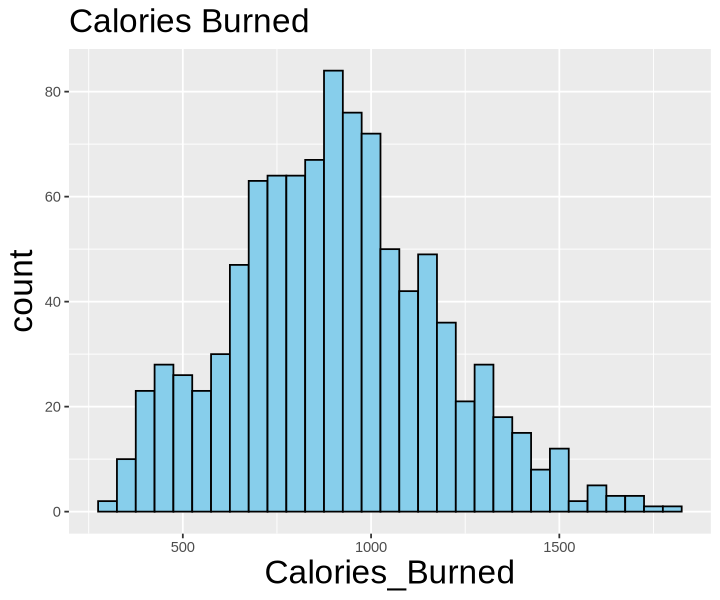

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


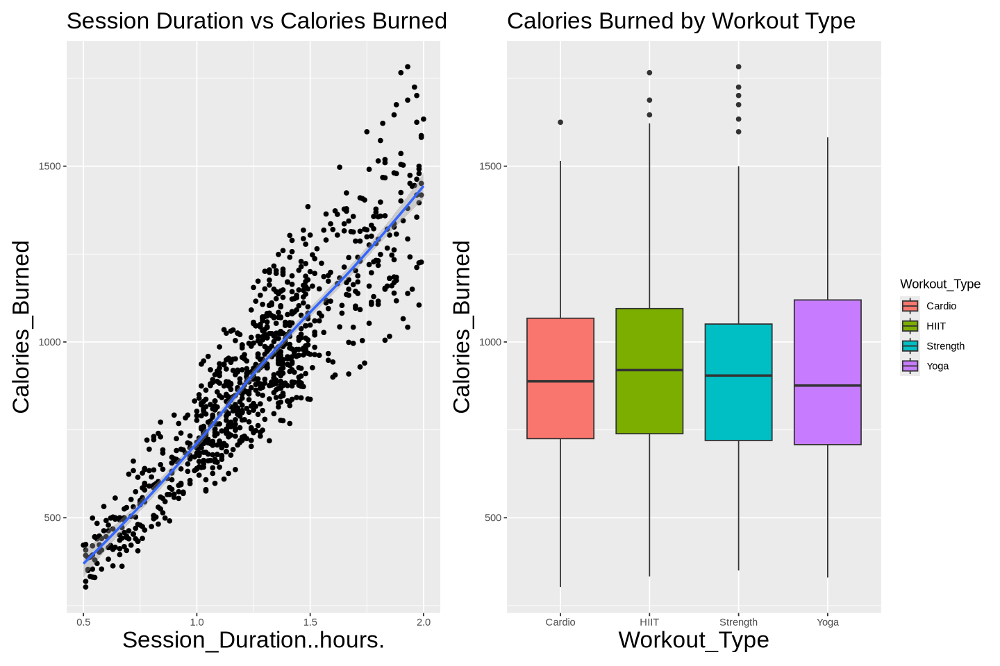

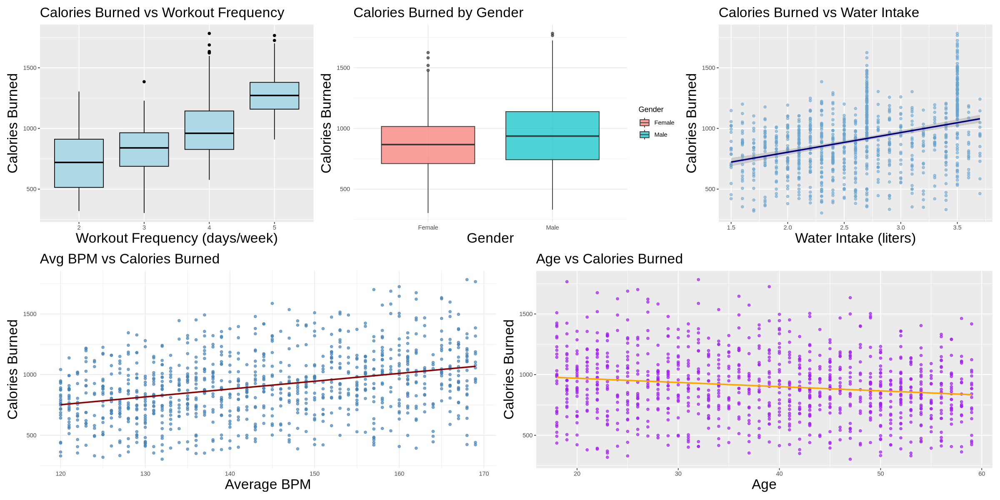

In [14]:
options(repr.plot.width = 6, repr.plot.height = 5)
calorie <- ggplot(gym_membership_data, aes(x = Calories_Burned)) +
  geom_histogram(binwidth = 50, fill = "skyblue", color = "black") +
  labs(title = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

wtype <- ggplot(gym_membership_data, aes(x = Workout_Type, y = Calories_Burned, fill = Workout_Type)) +
  geom_boxplot() +
  labs(title = "Calories Burned by Workout Type")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )
duration <- ggplot(gym_membership_data, aes(x = Session_Duration..hours., y = Calories_Burned)) +
  geom_point() +
  geom_smooth() +
  labs(title = "Session Duration vs Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

gender <- ggplot(gym_membership_data, aes(x = Gender, y = Calories_Burned, fill = Gender)) +
  geom_boxplot(alpha = 0.7) +
  labs(title = "Calories Burned by Gender", x = "Gender", y = "Calories Burned") +
  theme_minimal()+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )
avg_bpm <- ggplot(gym_membership_data, aes(x = Avg_BPM, y = Calories_Burned)) +
  geom_point(color = "steelblue", alpha = 0.7) +
  geom_smooth(method = "lm", color = "darkred", se = FALSE) +
  labs(title = "Avg BPM vs Calories Burned", x = "Average BPM", y = "Calories Burned") +
  theme_minimal()+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )
rest_bpm <- ggplot(gym_membership_data, aes(x = Resting_BPM, y = Calories_Burned)) +
  geom_point(color = "darkgreen", alpha = 0.7) +
  geom_smooth(method = "lm", color = "black", se = FALSE) +
  labs(title = "Resting BPM vs Calories Burned", x = "Resting BPM", y = "Calories Burned") +
  theme_minimal()+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

age <- ggplot(gym_membership_data, aes(x = Age, y = Calories_Burned)) +
  geom_point(color = "purple", alpha = 0.7) +
  geom_smooth(method = "lm", color = "orange", se = FALSE) +
  labs(title = "Age vs Calories Burned", x = "Age", y = "Calories Burned") + 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

freq <- ggplot(gym_membership_data, aes(x = factor(Workout_Frequency..days.week.), y = Calories_Burned)) +
  geom_boxplot(fill = "lightblue", color = "black") +
  labs(title = "Calories Burned vs Workout Frequency", x = "Workout Frequency (days/week)", y = "Calories Burned") + 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

water <- ggplot(gym_membership_data, aes(x = Water_Intake..liters., y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "skyblue3") +
  geom_smooth(method = "lm", color = "navy") +
  labs(title = "Calories Burned vs Water Intake", x = "Water Intake (liters)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

calorie
options(repr.plot.width = 12, repr.plot.height = 8)
(duration |wtype)
options(repr.plot.width = 20, repr.plot.height = 10)
(freq | gender | water)/(avg_bpm | age)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


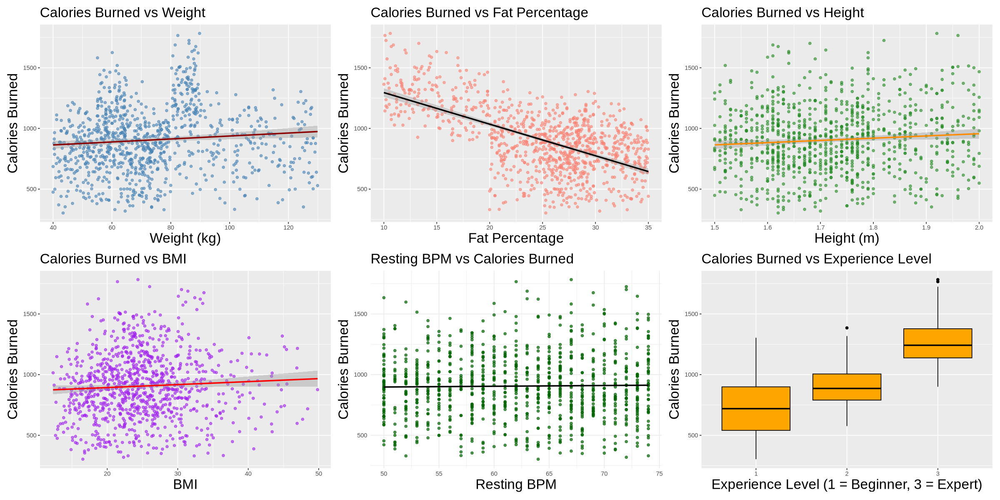

In [15]:
weight <- ggplot(gym_membership_data, aes(x = Weight..kg., y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "steelblue") +
  geom_smooth(method = "lm", se = TRUE, color = "darkred") +
  labs(title = "Calories Burned vs Weight", x = "Weight (kg)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

height <- ggplot(gym_membership_data, aes(x = Height..m., y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "forestgreen") +
  geom_smooth(method = "lm", color = "darkorange") +
  labs(title = "Calories Burned vs Height", x = "Height (m)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

bmi <- ggplot(gym_membership_data, aes(x = BMI, y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "purple") +
  geom_smooth(method = "lm", color = "red") +
  labs(title = "Calories Burned vs BMI", x = "BMI", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )


fat <- ggplot(gym_membership_data, aes(x = Fat_Percentage, y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "salmon") +
  geom_smooth(method = "lm", color = "black") +
  labs(title = "Calories Burned vs Fat Percentage", x = "Fat Percentage", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

exp <- ggplot(gym_membership_data, aes(x = factor(Experience_Level), y = Calories_Burned)) +
  geom_boxplot(fill = "orange", color = "black") +
  labs(title = "Calories Burned vs Experience Level", x = "Experience Level (1 = Beginner, 3 = Expert)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )


options(repr.plot.width = 20, repr.plot.height = 10)
(weight | fat | height )/(bmi | rest_bpm | exp)

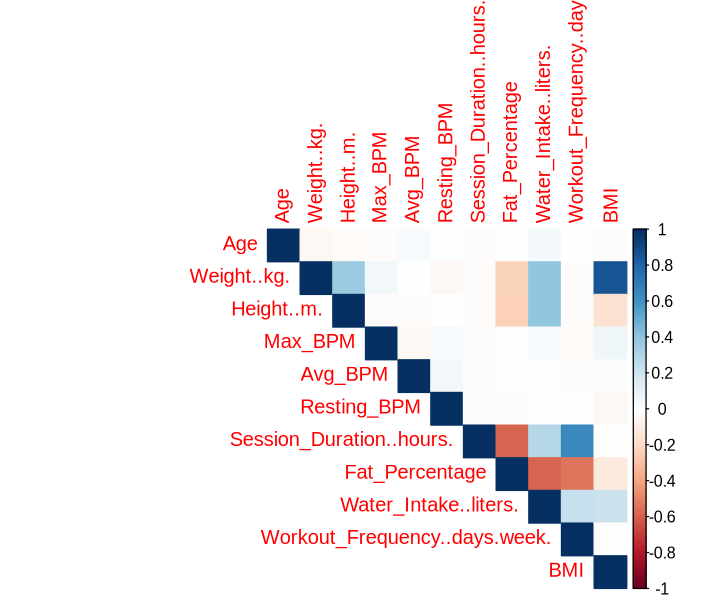

In [16]:
# Correlation matrix for numeric variables
options(repr.plot.width = 6, repr.plot.height = 5)
num_vars <- gym_membership_data %>% 
    select(where(is.numeric)) %>% 
    select(-Calories_Burned)
corrplot(cor(num_vars), method = "color", type = "upper")

# Model Selection

In [7]:
split <- initial_split(gym_membership_data, prop = 0.7)
gym_membership_train <- training(split)
gym_membership_test <- testing(split)

In [8]:
base_model <- lm(Calories_Burned ~ ., data = gym_membership_train)
summary(base_model)


Call:
lm(formula = Calories_Burned ~ ., data = gym_membership_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-126.223  -24.255   -2.834   23.899  172.710 

Coefficients:
                                Estimate Std. Error t value Pr(>|t|)    
(Intercept)                   -971.12329  108.91176  -8.917   <2e-16 ***
Age                             -3.46998    0.12937 -26.823   <2e-16 ***
GenderMale                      81.21010    6.20942  13.079   <2e-16 ***
Weight..kg.                     -0.86022    0.64230  -1.339   0.1809    
Height..m.                     101.06282   58.62697   1.724   0.0852 .  
Max_BPM                          0.04532    0.13434   0.337   0.7360    
Avg_BPM                          6.19168    0.10715  57.783   <2e-16 ***
Resting_BPM                      0.31861    0.21219   1.502   0.1337    
Session_Duration..hours.       712.62068    7.12930  99.957   <2e-16 ***
Workout_TypeHIIT                -0.09332    4.49199  -0.021   0.9834    
Workout_

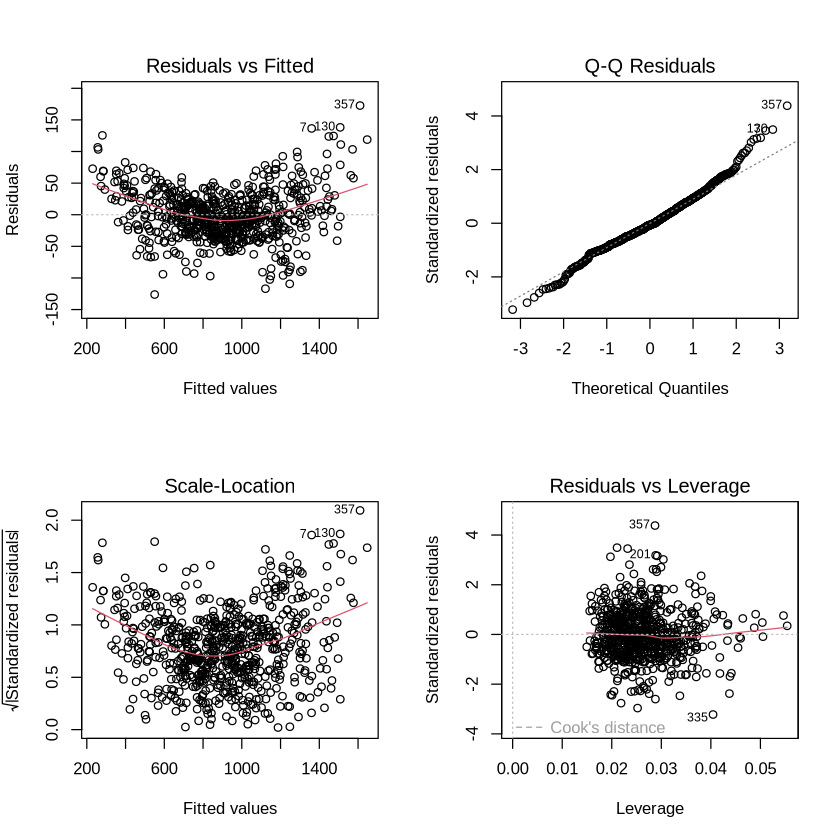

In [9]:
par(mfrow = c(2, 2))
plot(base_model)
par(mfrow = c(1,1))

In [10]:
vif(base_model)

,GVIF,Df,GVIF^(1/(2*Df))
Age,1.024721,1,1.012285
Gender,4.090182,1,2.022420
Weight..kg.,76.228574,1,8.730898
Height..m.,23.073214,1,4.803459
Max_BPM,1.020711,1,1.010303
Avg_BPM,1.019648,1,1.009776
Resting_BPM,1.031289,1,1.015524
Session_Duration..hours.,2.649979,1,1.627876
Workout_Type,1.068184,3,1.011054
Fat_Percentage,5.368693,1,2.317044


In [11]:
# Assume df is your dataframe
model <- regsubsets(Calories_Burned ~ Age + Gender + Weight..kg. + Height..m. + Max_BPM +
                    Avg_BPM + Resting_BPM + Session_Duration..hours. + Workout_Type +
                    Fat_Percentage + Water_Intake..liters. + Workout_Frequency..days.week. +
                    Experience_Level + BMI, 
                    data = gym_membership_train, nvmax = 14)

summary(model)

Subset selection object
Call: regsubsets.formula(Calories_Burned ~ Age + Gender + Weight..kg. + 
    Height..m. + Max_BPM + Avg_BPM + Resting_BPM + Session_Duration..hours. + 
    Workout_Type + Fat_Percentage + Water_Intake..liters. + Workout_Frequency..days.week. + 
    Experience_Level + BMI, data = gym_membership_train, nvmax = 14)
17 Variables  (and intercept)
                              Forced in Forced out
Age                               FALSE      FALSE
GenderMale                        FALSE      FALSE
Weight..kg.                       FALSE      FALSE
Height..m.                        FALSE      FALSE
Max_BPM                           FALSE      FALSE
Avg_BPM                           FALSE      FALSE
Resting_BPM                       FALSE      FALSE
Session_Duration..hours.          FALSE      FALSE
Workout_TypeHIIT                  FALSE      FALSE
Workout_TypeStrength              FALSE      FALSE
Workout_TypeYoga                  FALSE      FALSE
Fat_Percentage      

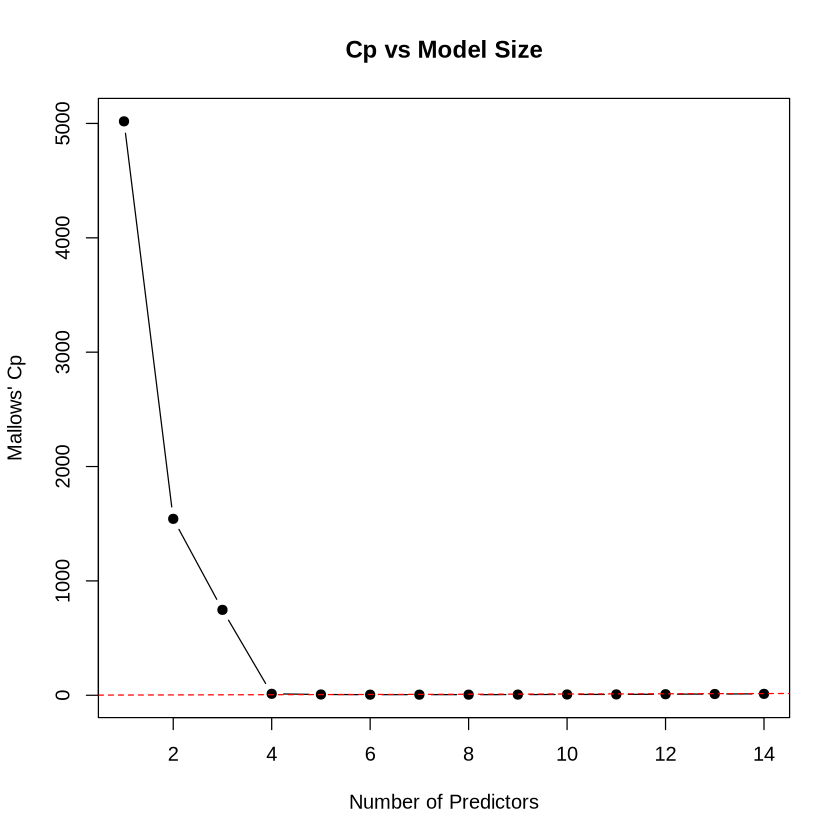

In [12]:
model_summary <- summary(model)

plot(model_summary$cp,
     xlab = "Number of Predictors",
     ylab = "Mallows' Cp",
     type = "b",
     pch = 19,
     main = "Cp vs Model Size")

abline(a = 1, b = 1, col = "red", lty = 2)

In [13]:
metrics_df <- data.frame(
  Model_Size = 1:length(model_summary$rsq),
  R2 = model_summary$rsq,
  Adjusted_R2 = model_summary$adjr2,
  Cp = model_summary$cp
)

print(metrics_df)

   Model_Size        R2 Adjusted_R2          Cp
1           1 0.8279947   0.8277414 5018.466557
2           2 0.9330244   0.9328269 1542.706466
3           3 0.9571212   0.9569312  746.811246
4           4 0.9793522   0.9792300   12.694297
5           5 0.9795887   0.9794375    6.862235
6           6 0.9796972   0.9795165    5.269426
7           7 0.9797568   0.9795462    5.296171
8           8 0.9798124   0.9795721    5.454401
9           9 0.9798572   0.9795871    5.970150
10         10 0.9798895   0.9795893    6.903145
11         11 0.9799306   0.9796006    7.541524
12         12 0.9799422   0.9795819    9.157039
13         13 0.9799451   0.9795542   11.061220
14         14 0.9799644   0.9795432   12.422688


In [21]:
best_lm <- lm(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender +
                  Age + Workout_Type, data = gym_membership_train)
pred_best_lm <- predict(best_lm, newdata = gym_membership_test)

base_lm <- lm(Calories_Burned ~ .,
                    data = gym_membership_train)
base_summary <- summary(base_lm)

base_summary <- summary(base_lm)
best_summary <- summary(best_lm)


In [22]:
comparison <- data.frame(
  Model = c("Base", "Best"),
  R_squared = c(base_summary$r.squared, best_summary$r.squared),
  Adjusted_R_squared = c(base_summary$adj.r.squared, best_summary$adj.r.squared),
  RMSE = c(
    sqrt(mean((gym_membership_test$Calories_Burned - pred_base_lm)^2)),
    sqrt(mean((gym_membership_test$Calories_Burned - pred_best_lm)^2))
  )
)
comparison

Model,R_squared,Adjusted_R_squared,RMSE
<chr>,<dbl>,<dbl>,<dbl>
Base,0.9799771,0.9794637,38.88033
Best,0.9796466,0.9794349,38.93841


In [23]:
importance <- varImp(best_lm)
print(importance)

                              Overall
Session_Duration..hours. 162.83769756
Avg_BPM                   58.26895552
GenderMale                28.86884506
Age                       26.93875109
Workout_TypeHIIT           0.05686445
Workout_TypeStrength       1.23501469
Workout_TypeYoga           2.74630456


In [24]:
summary(best_lm)


Call:
lm(formula = Calories_Burned ~ Session_Duration..hours. + Avg_BPM + 
    Gender + Age + Workout_Type, data = gym_membership_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-124.789  -25.795   -2.694   24.066  179.340 

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)              -794.8598    17.0908 -46.508  < 2e-16 ***
Session_Duration..hours.  716.3720     4.3993 162.838  < 2e-16 ***
Avg_BPM                     6.2068     0.1065  58.269  < 2e-16 ***
GenderMale                 88.9253     3.0803  28.869  < 2e-16 ***
Age                        -3.4532     0.1282 -26.939  < 2e-16 ***
Workout_TypeHIIT           -0.2542     4.4704  -0.057  0.95467    
Workout_TypeStrength       -5.2505     4.2513  -1.235  0.21726    
Workout_TypeYoga          -11.7942     4.2946  -2.746  0.00619 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 40.02 on 673 degrees of freedom
Multiple R-squa

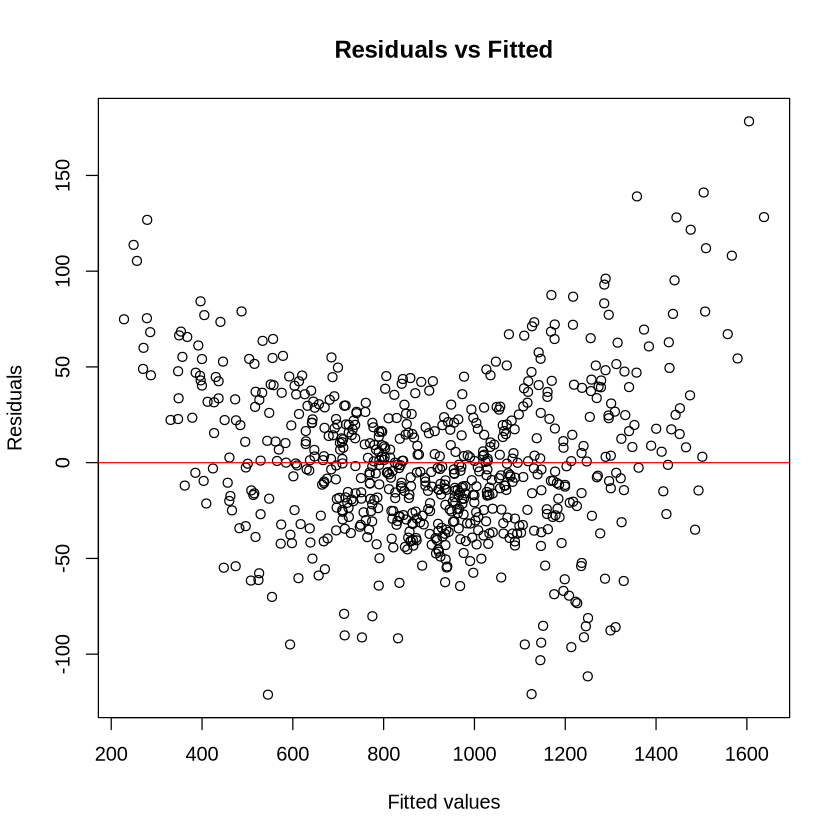

In [18]:
plot(fitted(best_lm), residuals(best_lm),
     xlab = "Fitted values", ylab = "Residuals",
     main = "Residuals vs Fitted")
abline(h = 0, col = "red")

# Using Extended Model

In [16]:
# Base Model (again)
base_lm <- lm(Calories_Burned ~ .,
                    data = gym_membership_train)

pred_base_lm <- predict(base_lm, newdata = gym_membership_test)


In [27]:
extended_lm <- lm(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender +
                  Age + Workout_Type, data = gym_membership_train)
pred_extended_lm <- predict(extended_lm, newdata = gym_membership_test)

In [28]:
base_summary <- summary(base_lm)
extended_summary <- summary(extended_lm)

comparison <- data.frame(
  Model = c("Base", "Extended"),
  R_squared = c(base_summary$r.squared, extended_summary$r.squared),
  Adjusted_R_squared = c(base_summary$adj.r.squared, extended_summary$adj.r.squared),
  RMSE = c(
    sqrt(mean((gym_membership_test$Calories_Burned - pred_base_lm)^2)),
    sqrt(mean((gym_membership_test$Calories_Burned - pred_extended_lm)^2))
  )
)
comparison

Model,R_squared,Adjusted_R_squared,RMSE
<chr>,<dbl>,<dbl>,<dbl>
Base,0.9791568,0.9786223,40.47713
Extended,0.9787844,0.9785638,40.41009


In [29]:
importance <- varImp(extended_lm)
print(importance)

                             Overall
Session_Duration..hours. 162.0440321
Avg_BPM                   58.8404470
GenderMale                28.1883326
Age                       26.8833103
Workout_TypeHIIT           0.1518561
Workout_TypeStrength       1.5578005
Workout_TypeYoga           1.9469352


In [30]:
vif(extended_lm)

,GVIF,Df,GVIF^(1/(2*Df))
Session_Duration..hours.,1.008952,1,1.004466
Avg_BPM,1.008049,1,1.004016
Gender,1.008274,1,1.004128
Age,1.006396,1,1.003193
Workout_Type,1.014264,3,1.002363


## SEIF

In [32]:
base_lm <- lm(Calories_Burned ~ Session_Duration..hours. + Workout_Type + Workout_Frequency..days.week. + Gender + Water_Intake..liters. + Avg_BPM + Age, data = gym_membership_data)
summary(base_lm)


Call:
lm(formula = Calories_Burned ~ Session_Duration..hours. + Workout_Type + 
    Workout_Frequency..days.week. + Gender + Water_Intake..liters. + 
    Avg_BPM + Age, data = gym_membership_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-127.522  -25.350   -1.735   22.666  178.688 

Coefficients:
                                Estimate Std. Error t value Pr(>|t|)    
(Intercept)                   -807.58847   15.16329 -53.259   <2e-16 ***
Session_Duration..hours.       714.27527    5.00971 142.578   <2e-16 ***
Workout_TypeHIIT                -0.97216    3.65517  -0.266   0.7903    
Workout_TypeStrength            -2.48940    3.51295  -0.709   0.4787    
Workout_TypeYoga                -7.34412    3.58292  -2.050   0.0407 *  
Workout_Frequency..days.week.    1.70406    1.83716   0.928   0.3539    
GenderMale                      89.39918    3.58751  24.920   <2e-16 ***
Water_Intake..liters.           -0.50538    3.12450  -0.162   0.8715    
Avg_BPM                   

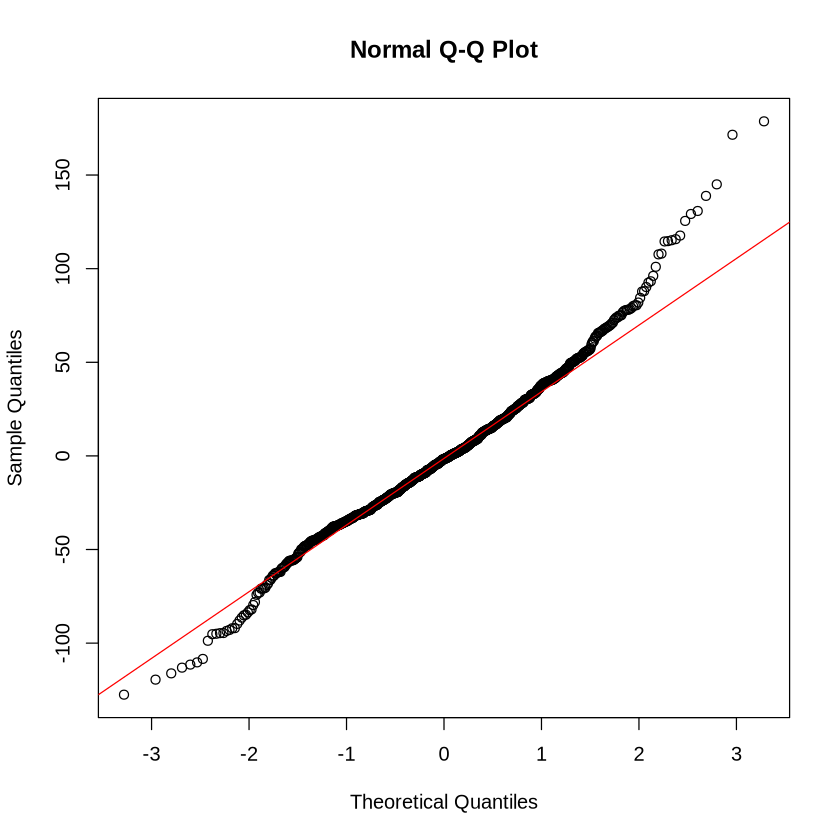

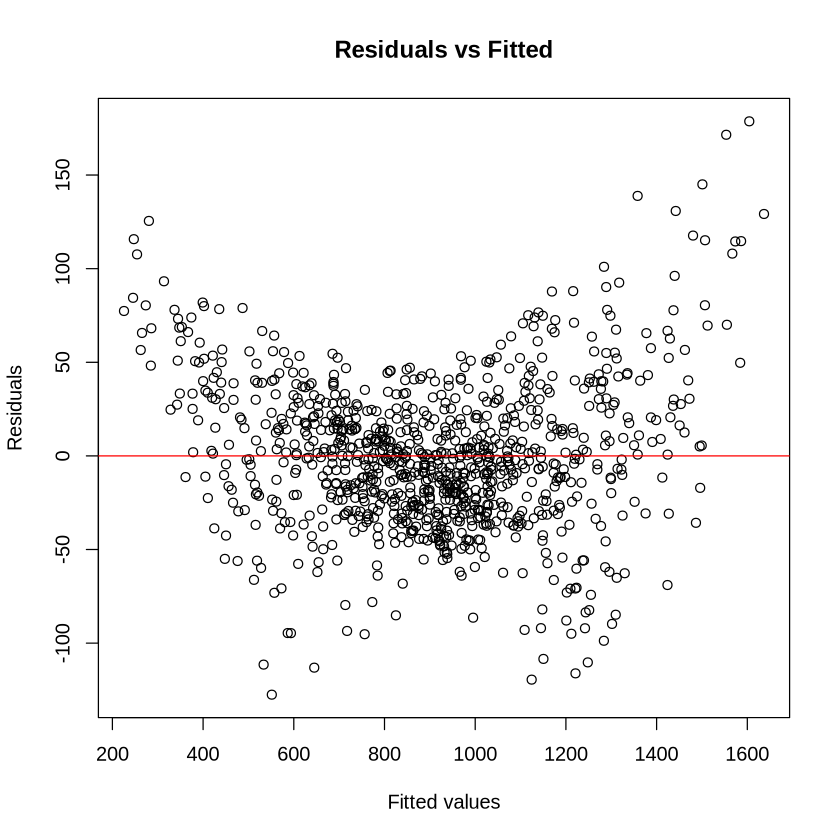

In [33]:
qqnorm(residuals(base_lm))
qqline(residuals(base_lm), col = "red")

plot(fitted(base_lm), residuals(base_lm),
     xlab = "Fitted values", ylab = "Residuals",
     main = "Residuals vs Fitted")
abline(h = 0, col = "red")

In [34]:
null_model <- lm(Calories_Burned ~ 1, data = gym_membership_data)

full_model <- lm(Calories_Burned ~ 
  Workout_Type * Avg_BPM + 
  Workout_Type * Session_Duration..hours. + 
  Gender * Avg_BPM + 
  Gender * Age + 
  Water_Intake..liters. +
  I(Workout_Frequency..days.week.^2) +
  I(Avg_BPM^2) +
  I(Age^2),
  data = gym_membership_data)

forward_model <- step(null_model, 
                      scope = formula(full_model), 
                      direction = "forward")
summary(forward_model)

Start:  AIC=10914.47
Calories_Burned ~ 1

                                     Df Sum of Sq      RSS     AIC
+ Session_Duration..hours.            1  59587644 12664418  9222.1
+ I(Workout_Frequency..days.week.^2)  1  25312761 46939301 10496.8
+ Water_Intake..liters.               1   9204877 63047184 10783.9
+ Avg_BPM                             1   8335577 63916485 10797.2
+ I(Avg_BPM^2)                        1   8303450 63948611 10797.7
+ I(Age^2)                            1   1832265 70419796 10891.5
+ Age                                 1   1728668 70523393 10892.9
+ Gender                              1   1639714 70612347 10894.1
<none>                                            72252061 10914.5
+ Workout_Type                        3    211670 72040391 10917.6

Step:  AIC=9222.13
Calories_Burned ~ Session_Duration..hours.

                                     Df Sum of Sq      RSS    AIC
+ Avg_BPM                             1   7638999  5025418 8324.8
+ I(Avg_BPM^2)           


Call:
lm(formula = Calories_Burned ~ Session_Duration..hours. + Avg_BPM + 
    Gender + I(Age^2) + Age + Avg_BPM:Gender + Gender:Age, data = gym_membership_data)

Residuals:
    Min      1Q  Median      3Q     Max 
-144.69  -23.49   -0.19   23.14  166.32 

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)    
(Intercept)              -7.965e+02  2.321e+01 -34.320  < 2e-16 ***
Session_Duration..hours.  7.159e+02  3.670e+00 195.066  < 2e-16 ***
Avg_BPM                   5.890e+00  1.267e-01  46.475  < 2e-16 ***
GenderMale               -1.923e+00  2.632e+01  -0.073  0.94178    
I(Age^2)                 -2.690e-02  9.624e-03  -2.795  0.00529 ** 
Age                      -1.205e+00  7.458e-01  -1.615  0.10657    
Avg_BPM:GenderMale        7.162e-01  1.755e-01   4.080 4.87e-05 ***
GenderMale:Age           -3.226e-01  2.069e-01  -1.559  0.11926    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 39.18 on 965 degrees of

In [35]:
stepwise_model <- step(full_model, direction = "both", trace = FALSE)
summary(stepwise_model)


Call:
lm(formula = Calories_Burned ~ Workout_Type + Avg_BPM + Session_Duration..hours. + 
    Gender + Age + I(Age^2) + Workout_Type:Avg_BPM + Workout_Type:Session_Duration..hours. + 
    Avg_BPM:Gender, data = gym_membership_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-136.476  -24.281    0.246   22.538  146.825 

Coefficients:
                                                Estimate Std. Error t value
(Intercept)                                   -761.20860   31.54198 -24.133
Workout_TypeHIIT                               -62.64689   38.00176  -1.649
Workout_TypeStrength                           -93.61257   37.01149  -2.529
Workout_TypeYoga                                18.84350   37.99556   0.496
Avg_BPM                                          5.80580    0.19278  30.117
Session_Duration..hours.                       702.20019    7.09846  98.923
GenderMale                                     -11.89767   25.43669  -0.468
Age                                     

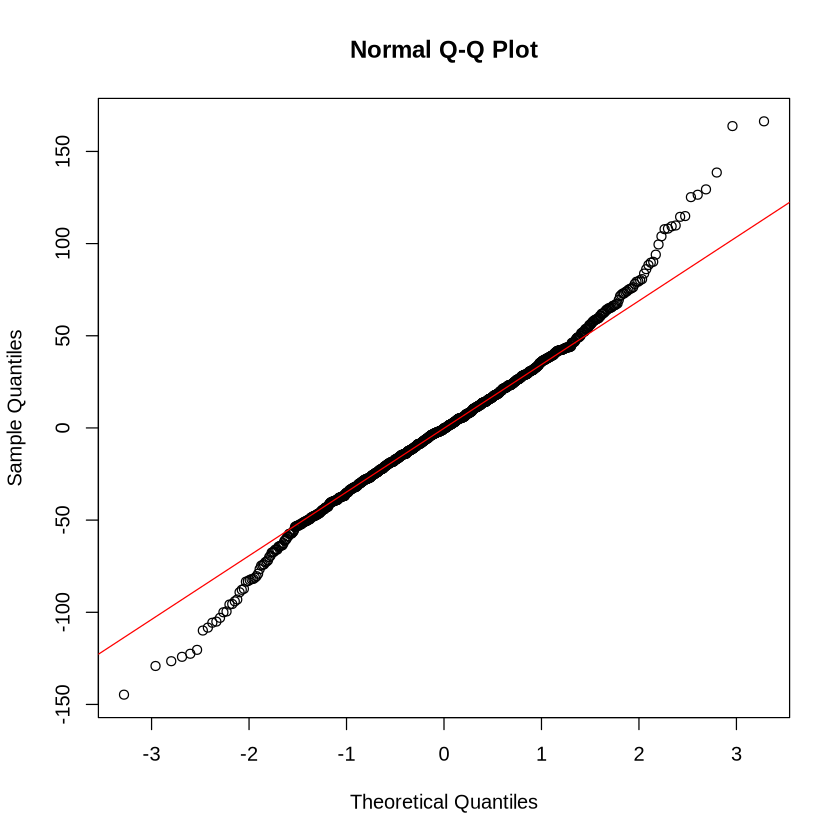

In [36]:
qqnorm(residuals(forward_model))
qqline(residuals(forward_model), col = "red")

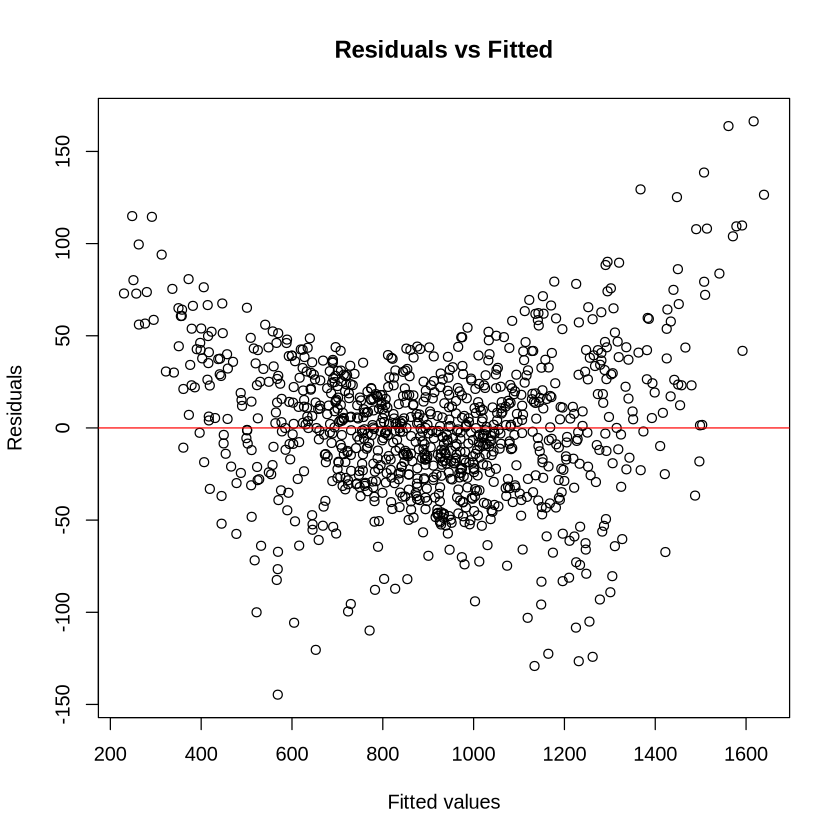

In [37]:
plot(fitted(forward_model), residuals(forward_model),
     xlab = "Fitted values", ylab = "Residuals",
     main = "Residuals vs Fitted")
abline(h = 0, col = "red")